In [1]:
import sys
import os
import math
import glob
import json

import argparse
import functools

import numpy as np
import pandas as pd
import geopandas as gpd
from shapely import wkt
from shapely.geometry import Polygon, shape, Point, mapping
from shapely.ops import transform
import pyproj

import dask
import dask.dataframe as ddf
from dask.distributed import LocalCluster, Client

import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import TwoSlopeNorm

from tqdm import tqdm

In [2]:
import fiona
fiona.supported_drivers

{'ARCGEN': 'r',
 'DXF': 'rw',
 'CSV': 'raw',
 'OpenFileGDB': 'r',
 'ESRIJSON': 'r',
 'ESRI Shapefile': 'raw',
 'FlatGeobuf': 'rw',
 'GeoJSON': 'raw',
 'GeoJSONSeq': 'rw',
 'GPKG': 'raw',
 'GML': 'rw',
 'OGR_GMT': 'rw',
 'GPX': 'rw',
 'GPSTrackMaker': 'rw',
 'Idrisi': 'r',
 'MapInfo File': 'raw',
 'DGN': 'raw',
 'PCIDSK': 'rw',
 'OGR_PDS': 'r',
 'S57': 'r',
 'SQLite': 'raw',
 'TopoJSON': 'r'}

In [3]:
def get_conf(conf_path):
    with open(conf_path, 'r') as f:
        config = json.load(f)
    return config

In [4]:
def get_area_perimeter_from_lambert(geom):
    '''Area from cell's lambert azimutal projection'''
    perimeter = np.nan
    area = np.nan
    try:
        if (-180 <= geom.centroid.x <= 180) and (-90 <= geom.centroid.y <= 90):
            proj_str = f"+proj=laea +lat_0={geom.centroid.y} +lon_0={geom.centroid.x}"
            project = pyproj.Transformer.from_crs('EPSG:4236', proj_str, always_xy=True).transform
            perimeter = transform(project, geom).length
            area = transform(project, geom).area
        else:
            # print(f'invalid centroid {geom.centroid}')
            pass
    except Exception as ex:
        print(f'invalid centroid Exception')
        print(ex)
    # return (area, perimeter)
    return pd.Series([area, perimeter])

In [5]:
def compactness_calculation_np(df, spherical=False):
    np_area = df['area'].values
    np_peri = df['perimeter'].values

    if not spherical:
        top = 4*np.pi*np_area
        bottom = np.square(np_peri)
        ipq = top / bottom

        return ipq
    else:
        t1 = 4*np.pi*np_area
        t2 = np.square(np_area)
        t3 = np.square(6378137.0)
        top = np.sqrt( t1 - t2/t3 )
        bottom = np_peri
        zsc_np = top / bottom

        # zsc_orig = df.apply(lambda row: math.sqrt(  4*math.pi*row['area'] - math.pow(row['area'],2) / math.pow(6378137,2)  )  /   row['perimeter'], axis=1).values
        # diffs = np.sum(zsc_np - zsc_orig)
        # ma = max_error(zsc_orig, zsc_np)
        # mae = mean_absolute_error(zsc_orig, zsc_np)
        # print(f"ma={ma} mae={mae} diffs={diffs}")

        return zsc_np

In [6]:
def check_crossing(lon1: float, lon2: float, validate: bool = True):
    """
    Assuming a minimum travel distance between two provided longitude coordinates,
    checks if the 180th meridian (antimeridian) is crossed.
    """
    if validate and any(abs(x) > 180.0 for x in [lon1, lon2]):
        raise ValueError("longitudes must be in degrees [-180.0, 180.0]")
    return abs(lon2 - lon1) > 180.0


def check_for_geom(geom):
    crossed = False
    p_init = geom.exterior.coords[0]

    for p in range(1, len(geom.exterior.coords)):
        px = geom.exterior.coords[p]
        # print(px)
        try:
            if check_crossing(p_init[0], px[0]):
                crossed = True
        except ValueError:
            crossed = True

        p_init = px

    return crossed

In [7]:
def check_geom_dfp(gdf):
    gdf['crossed'] = gdf['geometry'].apply(check_for_geom)
    return gdf

In [8]:
results_path = "../results_gen_bak"
config_path = '../cell_stats/config-main1.json'
default_name = 'cell_stats_main1'

sample_polygons = gpd.read_file('../cell_stats/sample_polygons.geojson',driver='GeoJSON')

config = get_conf(config_path)

In [9]:
config

{'dggss': [{'name': ['h3'],
   'global_res': [2, 3, 4, 5, 6],
   'sample_res': [],
   'proj': 'LAEA'},
  {'name': ['s2'],
   'global_res': [2, 3, 4, 5, 6, 7, 8, 9],
   'sample_res': [],
   'proj': 'LAEA'},
  {'name': ['rhpix'],
   'global_res': [2, 3, 4, 5, 6],
   'sample_res': [],
   'proj': 'LAEA'},
  {'name': ['DGGRID', 'ISEA7H'],
   'global_res': [2, 3, 4, 5, 6],
   'sample_res': [],
   'proj': 'LAEA'},
  {'name': ['DGGRID', 'FULLER7H'],
   'global_res': [2, 3, 4, 5, 6],
   'sample_res': [],
   'proj': 'LAEA'},
  {'name': ['DGGRID', 'ISEA4T'],
   'global_res': [2, 3, 4, 5, 6, 7, 8],
   'sample_res': [],
   'proj': 'LAEA'},
  {'name': ['DGGRID', 'FULLER4T'],
   'global_res': [2, 3, 4, 5, 6, 7, 8],
   'sample_res': [],
   'proj': 'LAEA'},
  {'name': ['DGGRID', 'ISEA4D'],
   'global_res': [2, 3, 4, 5, 6, 7, 8],
   'sample_res': [],
   'proj': 'LAEA'},
  {'name': ['DGGRID', 'FULLER4D'],
   'global_res': [2, 3, 4, 5, 6, 7, 8],
   'sample_res': [],
   'proj': 'LAEA'},
  {'name': ['DGGRID

In [10]:
[print( f"{idx}: {name['name']}") for (idx, name) in enumerate(config['dggss'])]

0: ['h3']
1: ['s2']
2: ['rhpix']
3: ['DGGRID', 'ISEA7H']
4: ['DGGRID', 'FULLER7H']
5: ['DGGRID', 'ISEA4T']
6: ['DGGRID', 'FULLER4T']
7: ['DGGRID', 'ISEA4D']
8: ['DGGRID', 'FULLER4D']
9: ['DGGRID', 'ISEA3H']
10: ['DGGRID', 'FULLER3H']
11: ['eaggr', 'ISEA4T']
12: ['eaggr', 'ISEA3H']


[None, None, None, None, None, None, None, None, None, None, None, None, None]

In [22]:
counter = 0
counter_step2 = 0
found_files = []
found_step2_files = []

for dggs in config['dggss']:
    for res in dggs['global_res']:
        
        params = [dggs['name'], res, dggs['proj'], None]
        d_name, res, p_name = params[0], params[1], params[2]

        name = d_name[0]
        if len(d_name) > 1:
            name = '_'.join(d_name)

        name = f"{name}_{res}_{p_name}"
        parquet_file_name = os.path.join(results_path, f"{name}.parquet")
        

        if os.path.exists(parquet_file_name):
            # print(f"{parquet_file_name} file exists, ok")
            counter = counter + 1
            found_files.append(parquet_file_name)
        else:
            print(f"{parquet_file_name} file MISSING")
        
        fgb_file_name = os.path.join(results_path, f"{name}_step2.fgb")
        
        if os.path.exists(fgb_file_name):
            # print(f"{fgb_file_name} file exists, ok")
            counter_step2 = counter + 1
            found_step2_files.append(fgb_file_name)
        else:
            print(f"{fgb_file_name} file MISSING")
    
    for res in dggs['sample_res']:
        
        params = [dggs['name'], res, dggs['proj'], None]
        d_name, res, p_name = params[0], params[1], params[2]

        for idx, row in sample_polygons.iterrows():
            name = d_name[0]
            if len(d_name) > 1:
                name = '_'.join(d_name)

            name = f"{name}_{res}_{p_name}_sample_id_{idx}"
            parquet_file_name = os.path.join(results_path, f"{name}.parquet")

            if os.path.exists(parquet_file_name):
                # print(f"{parquet_file_name} file exists, ok")
                counter = counter + 1
                found_files.append(parquet_file_name)
            else:
                print(f"{parquet_file_name} file MISSING")


assert(len(set(found_files)) == counter)

../results_gen_bak/h3_5_LAEA_step2.fgb file MISSING
../results_gen_bak/h3_6_LAEA_step2.fgb file MISSING
../results_gen_bak/s2_9_LAEA_step2.fgb file MISSING
../results_gen_bak/rhpix_6_LAEA_step2.fgb file MISSING
../results_gen_bak/DGGRID_ISEA7H_6_LAEA_step2.fgb file MISSING
../results_gen_bak/DGGRID_FULLER7H_6_LAEA_step2.fgb file MISSING
../results_gen_bak/DGGRID_ISEA4T_8_LAEA_step2.fgb file MISSING
../results_gen_bak/DGGRID_FULLER4T_8_LAEA_step2.fgb file MISSING
../results_gen_bak/DGGRID_ISEA4D_8_LAEA_step2.fgb file MISSING
../results_gen_bak/DGGRID_FULLER4D_8_LAEA_step2.fgb file MISSING
../results_gen_bak/eaggr_ISEA4T_8_LAEA_step2.fgb file MISSING
../results_gen_bak/eaggr_ISEA3H_6_LAEA_step2.fgb file MISSING


In [30]:
import glob

all_parquet = glob.glob(os.path.join(results_path, "*.parquet"))
all_count = len(all_parquet)

print(f"{counter} config based parquet files (vs {all_count}) glob")

diff = set(all_parquet).difference(set(found_files))

all_step2 = glob.glob(os.path.join(results_path, "*_step2.fgb"))
all_count_step2 = len(all_step2)

print(f"{counter_step2} config based step2 files (vs {all_count_step2}) glob")

diff_step2 = set(all_step2).difference(set(found_step2_files))

78 config based parquet files (vs 78) glob
78 config based step2 files (vs 66) glob


In [38]:
len(all_step2) - len( found_step2_files)

0

In [23]:
quick_stats = []

for parquet_file_name in tqdm(found_files):
    
    da = pd.read_parquet(parquet_file_name)
    rows = len(da.index)
    size = os.stat(parquet_file_name).st_size
    # print(f"{parquet_file_name} {rows}")
    quick_stats.append( (parquet_file_name.replace('../results_gen_bak/', ''), rows, size) )


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████| 78/78 [01:39<00:00,  1.27s/it]


In [24]:
qs = pd.DataFrame(quick_stats, columns=['filename', 'num_rows', 'filesize'])

qs.sort_values(by='filename').to_csv('../results_gen_bak/quick_stats.csv', index=False)

In [48]:
qs = pd.read_csv('../results_gen_bak/quick_stats.csv')

qs.sort_values(by=['num_rows'], ascending=False).head(15) # 'filesize', 

,filename,num_rows,filesize
64,h3_6_LAEA.parquet,14117882,1604716105
69,rhpix_6_LAEA.parquet,3188646,60147124
52,eaggr_ISEA3H_6_LAEA.parquet,2350280,70212715
63,h3_5_LAEA.parquet,2016842,229156730
77,s2_9_LAEA.parquet,1572864,45515563
42,DGGRID_ISEA4T_8_LAEA.parquet,1310720,36890452
59,eaggr_ISEA4T_8_LAEA.parquet,1310720,29648169
18,DGGRID_FULLER4T_8_LAEA.parquet,1310720,36867405
23,DGGRID_FULLER7H_6_LAEA.parquet,1176492,98034288
47,DGGRID_ISEA7H_6_LAEA.parquet,1176492,98016106


In [55]:
qs.loc[qs["num_rows"] > 400000].sort_values(by=['num_rows'], ascending=True)

,filename,num_rows,filesize
11,DGGRID_FULLER4D_8_LAEA.parquet,655360,31151958
35,DGGRID_ISEA4D_8_LAEA.parquet,655360,31178935
23,DGGRID_FULLER7H_6_LAEA.parquet,1176492,98034288
47,DGGRID_ISEA7H_6_LAEA.parquet,1176492,98016106
18,DGGRID_FULLER4T_8_LAEA.parquet,1310720,36867405
42,DGGRID_ISEA4T_8_LAEA.parquet,1310720,36890452
59,eaggr_ISEA4T_8_LAEA.parquet,1310720,29648169
77,s2_9_LAEA.parquet,1572864,45515563
63,h3_5_LAEA.parquet,2016842,229156730
52,eaggr_ISEA3H_6_LAEA.parquet,2350280,70212715


In [28]:
dclient.close()
cluster.close()

In [17]:
164 / 8

20.5

In [40]:
cpus = 8

cluster = LocalCluster(processes=True, n_workers=cpus)
dclient = Client(cluster)

chunksize = 2000
npartitions = cpus * 20

In [41]:
cluster

In [42]:
def the_job(parquet_file_name, return_file_name_step2, chunksize, npartitions, full_gdf=False, gdf_layer=None, gdf_driver="GPKG", epsg=4326):
    
    # da = ddf.read_parquet(parquet_file_name, chunksize=chunksize).repartition(npartitions=npartitions)
    da = ddf.read_parquet(parquet_file_name, chunksize=chunksize).repartition(npartitions=npartitions)
    
    da['geometry'] = da.map_partitions( lambda df: df['wkt'].apply(lambda s: wkt.loads(s) if not s == "error" else None), meta=pd.Series({'geometry': [ Point(1, 1) ]}))
    
    da = da.dropna(subset=['geometry'])

    da['crossed'] = da.map_partitions( lambda df: df['geometry'].apply(check_for_geom), meta=pd.Series({'crossed': [True]}))
    # da = da.map_partitions( check_geom_dfp, meta=pd.DataFrame({'cell_id':['str'], 'geometry': [ Point(1, 1) ], 'crossed': [True]}))
    
    # date_line_cross_error_cells = len(da[da['crossed']].compute().index)
    # da2 = da[~da['crossed']]

    result = da.map_partitions(lambda df: df['geometry'].apply(get_area_perimeter_from_lambert), meta=pd.DataFrame({0: [1.0], 1: [0.1]}))
    result = result.rename(columns={0: 'area', 1: 'perimeter'})
    da = da.assign(area=result['area'], perimeter=result['perimeter'] )
    
    # result = result.rename(columns={0: 'upd_siffer', 1: 'upd_siffer_info'})
    # ddf = ddf.assign(upd_siffer=result['upd_siffer'], upd_siffer_info=result['upd_siffer_info'])
    
    # da = da.map_partitions(lambda x: get_cells_area(x, params[2]), meta=pd.DataFrame({'cell_id':['str'], 'geometry': [ Point(1, 1) ], 'crossed': [True], 'area': [1.0],'perimeter': [0.1]}))
    # da4 = da2.persist()

    # area_q_low = da4['area'].quantile(0.005).compute()
    # area_q_high = da4['area'].quantile(0.995).compute()

    # other_geom_anomalies = len( da4[(da4['area'] < area_q_low) & (da4['area'] > area_q_high)] )

    # da4 = da4[(da4['area'] > area_q_low) & (da4['area'] < area_q_high)]

    # da5 = da4.persist()

    da['ipq'] = da.map_partitions(lambda df: compactness_calculation_np(df, False),meta=pd.Series({'ipq': [0.1]}))
    da['zsc'] = da.map_partitions(lambda df: compactness_calculation_np(df, True), meta=pd.Series({'zsc': [0.1]}))

    # da6 = da5.persist()
    # da['point_wkt'] = da['geometry'].apply(lambda x: x.wkt, meta=pd.Series({'point_wkt': ['str']}) )
    
    # result = da[~da['area'].isna()]['geometry'].apply(lambda g: pd.Series((g.centroid.x, g.centroid.y)))
    da = da[~da['area'].isna()]
    
    result = da.map_partitions(lambda df: df['geometry'].apply(lambda g: pd.Series((g.centroid.x, g.centroid.y))), meta=pd.DataFrame({0: [1.0], 1: [0.1]}))
    result = result.rename(columns={0: 'lon', 1: 'lat'})
    da = da.assign(lon=result['lon'], lat=result['lat'] )

    if full_gdf == True:
        df = da.compute()
        gdf = gpd.GeoDataFrame(df.drop(columns=['wkt']), geometry="geometry", crs=epsg)
        if gdf_layer is None:
            gdf.to_file(return_file_name_step2, driver=gdf_driver)
        else:
            gdf.to_file(return_file_name_step2, driver=gdf_driver, layername=layer)
    else:
        da = da.drop(columns=["geometry", 'wkt'])
        da.to_parquet(return_file_name_step2, schema="infer", compression='gzip', write_index=False, compute=True)
    return return_file_name_step2


In [56]:
tl = qs.loc[qs["num_rows"] > 400000].sort_values(by=['num_rows'], ascending=True)["filename"].apply(lambda s: '../results_gen_bak/' + s).tolist()
tl

['../results_gen_bak/DGGRID_FULLER4D_8_LAEA.parquet',
 '../results_gen_bak/DGGRID_ISEA4D_8_LAEA.parquet',
 '../results_gen_bak/DGGRID_FULLER7H_6_LAEA.parquet',
 '../results_gen_bak/DGGRID_ISEA7H_6_LAEA.parquet',
 '../results_gen_bak/DGGRID_FULLER4T_8_LAEA.parquet',
 '../results_gen_bak/DGGRID_ISEA4T_8_LAEA.parquet',
 '../results_gen_bak/eaggr_ISEA4T_8_LAEA.parquet',
 '../results_gen_bak/s2_9_LAEA.parquet',
 '../results_gen_bak/h3_5_LAEA.parquet',
 '../results_gen_bak/eaggr_ISEA3H_6_LAEA.parquet',
 '../results_gen_bak/rhpix_6_LAEA.parquet',
 '../results_gen_bak/h3_6_LAEA.parquet']

In [ ]:
tl = ["../cell_stats/rhpix_emerg/s2_3_LAEA.parquet"]
# rhpix_emerg/s2_3_LAEA.parquet
df = pd.read_parquet(tl_x[0])
df.head(2)

In [ ]:
for big_in in tqdm(tl):
    print(f"starting job for {big_in}")
    outfile = the_job(big_in, big_in.replace(".parquet", "_step2.fgb"), chunksize=chunksize, npartitions=npartitions, full_gdf=True, gdf_driver="FlatGeobuf")
    print(f"written with {outfile}")

In [18]:
grid = gpd.read_file(outfile)
grid['std_area'] = grid['area']/grid['area'].mean()

In [19]:
grid.head(2)

,cell_id,crossed,area,perimeter,ipq,zsc,lon,lat,geometry,std_area
0,af4,False,1.505031e+12,4.924948e+06,0.779744,0.881730,162.272705,-72.400986,"POLYGON ((180.00000 -67.38014, 155.77225 -65.4...",0.991552
1,a8c,False,1.367877e+12,4.716218e+06,0.772803,0.877915,170.000761,-61.151196,"POLYGON ((180.00000 -55.49148, 164.74488 -54.5...",0.901191


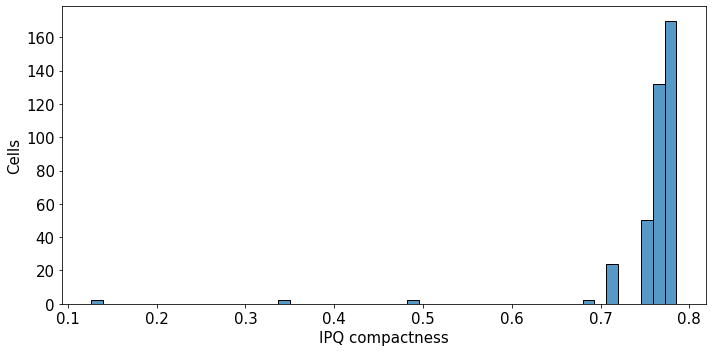

In [20]:
fig, ax = plt.subplots(figsize=(10,5))
sns.histplot(grid,x="ipq", ax=ax, bins=50)
ax.tick_params(axis='both', which='major', labelsize=15)
ax.set_xlabel('IPQ compactness', fontsize=15)
ax.set_ylabel('Cells', fontsize=15)
plt.tight_layout()
# plt.savefig(r'd:\UTCloud\DGGS\results\area_statistics\h3_compactness.png', bbox_inches="tight",dpi=300)

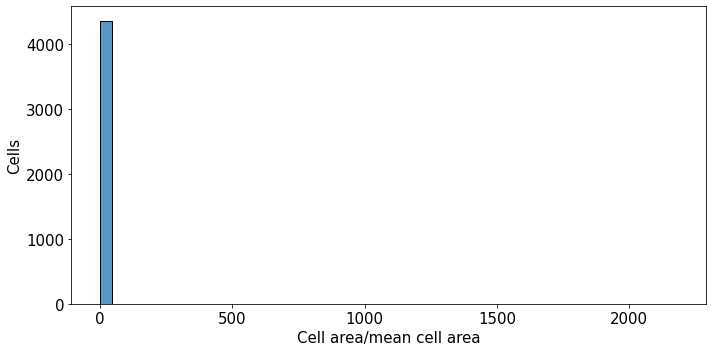

In [100]:
fig, ax = plt.subplots(figsize=(10,5))
sns.histplot(grid,x="std_area", ax=ax, bins=50)
ax.tick_params(axis='both', which='major', labelsize=15)
ax.set_xlabel('Cell area/mean cell area', fontsize=15)
ax.set_ylabel('Cells', fontsize=15)
plt.tight_layout()
# plt.savefig(r'd:\UTCloud\DGGS\results\area_statistics\h3_area.png', bbox_inches="tight",dpi=300)

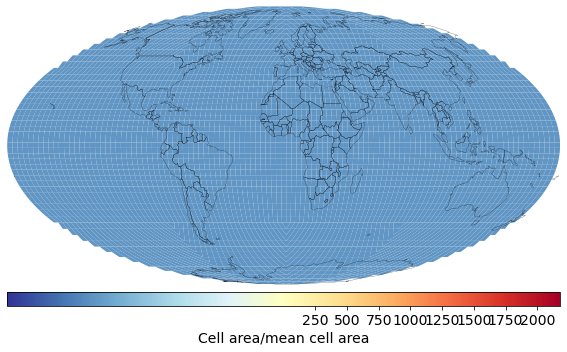

In [101]:
fig, ax = plt.subplots(figsize=(10,5))
divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="5%", pad=0.1)
vmin, vmax, vcenter = grid['std_area'].min(), grid['std_area'].max(), 1
norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)

grid[~grid['crossed']].to_crs('proj=moll').plot(column='std_area', ax=ax, norm=norm, legend=True,cax=cax, cmap='RdYlBu_r', legend_kwds={'label': "cell area/mean cell area",'orientation': "horizontal"})
# grid.to_crs('proj=moll').plot(column='std_area', ax=ax, norm=norm, legend=True,cax=cax, cmap='RdYlBu_r', legend_kwds={'label': "cell area/mean cell area",'orientation': "horizontal"})

world_countries.boundary.to_crs('proj=moll').plot(color=None, edgecolor='black',linewidth = 0.2,ax=ax)
ax.axis('off')
cb_ax = fig.axes[1] 
cb_ax.tick_params(labelsize=14)
cb_ax.set_xlabel(xlabel= "Cell area/mean cell area",fontsize=14)
ax.margins(0)
ax.tick_params(left=False, labelleft=False, bottom=False, labelbottom=False)
plt.tight_layout()
# plt.savefig(r'd:\UTCloud\DGGS\results\area_statistics\h3_area_map.png', bbox_inches="tight",dpi=300)



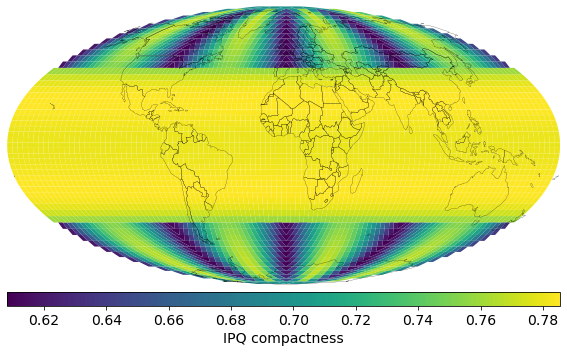

In [103]:
fig, ax = plt.subplots(figsize=(10,5))
divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="5%", pad=0.1)

grid[~grid['crossed']].to_crs('proj=moll').plot(column='ipq', ax=ax, legend=True,cax=cax, legend_kwds={'label': "IPQ compactness",'orientation': "horizontal"})
# grid.to_crs('proj=moll').plot(column='zsc', ax=ax, legend=True,cax=cax, legend_kwds={'label': "zonal standadized compactness",'orientation': "horizontal"})

world_countries.boundary.to_crs('proj=moll').plot(color=None, edgecolor='black',linewidth = 0.2,ax=ax)
ax.axis('off')
ax.margins(0)
cb_ax = fig.axes[1] 
cb_ax.tick_params(labelsize=14)
cb_ax.set_xlabel(xlabel= "IPQ compactness",fontsize=14)
ax.tick_params(left=False, labelleft=False, bottom=False, labelbottom=False)
plt.tight_layout()
# plt.savefig(r'd:\UTCloud\DGGS\results\area_statistics\h3_compactness_map.png', bbox_inches="tight",dpi=300)

In [80]:
done_files = []

for idx, row in qs.loc[qs["num_rows"] < 400000].iterrows():
    fname = '../results_gen_bak/' + row["filename"]
    outfile = the_job(fname, fname.replace(".parquet", "_step2.fgb"), chunksize=2000, npartitions=8, full_gdf=True, gdf_driver="FlatGeobuf")
    done_files.append(outfile)

/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,


invalid centroid POINT (-2407.29668097175 -195.540150086629)
invalid centroid POINT (-2407.296575299179 195.5401451564152)


/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,


invalid centroid POINT (-2661.222235617821 -128.6343307297828)
invalid centroid POINT (-2661.221844827411 128.6343247280567)


/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: panda

invalid centroid POINT (-1968.402008558293 -173.7888550505444)
invalid centroid POINT (-1968.402052972303 173.7888570941053)


/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,


invalid centroid POINT (-2422.059505790558 -124.7724432822547)
invalid centroid POINT (-2422.059726399876 124.7724466553916)


/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: panda

invalid centroid POINT (-611.877759436414 -81.04588082134681)


/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,


invalid centroid POINT (-620.1728322429865 -88.7057188792276)


/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,


invalid centroid POINT (-163.3854452690644 95.7589597180024)
invalid centroid POINT (163.3854458314126 95.75895977287786)


/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,


invalid centroid POINT (-105.4249292165154 -90.52946475718237)


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid POINT (105.4249302422813 -90.52946479165918)


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid POINT (-105.4249292165154 -90.52946475718237)
invalid centroid POINT (-105.4249292165154 -90.52946475718237)
invalid centroid POINT (-105.4249292165154 -90.52946475718237)


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid POINT (105.4249302422813 -90.52946479165918)


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid POINT (105.4249302422813 -90.52946479165918)
invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid POINT (105.4249302422813 -90.52946479165918)
invalid centroid POINT (105.4249302422813 -90.52946479165918)


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid POINT (-199.4878485483026 -74.5147073344572)


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid POINT (-199.4878485483026 -74.5147073344572)


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range
invalid centroid Exception
index out of range


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range
invalid centroid Exception
index out of range


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid POINT (-6608.193255530523 72.25834439770986)
invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range
invalid centroid Exception
index out of range


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range
invalid centroid Exception


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range
invalid centroid POINT (189.85070039397 -92.87979715066662)
invalid centroid POINT (189.85070039397 -92.87979715066662)


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid POINT (-6608.193255530523 72.25834439770986)
invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range
invalid centroid Exception
index out of range


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range
invalid centroid Exception
index out of range


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range
invalid centroid Exception
index out of range


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid POINT (180.8513580554054 -78.67957790085117)


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range
invalid centroid Exception
index out of range


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid POINT (180.8513580554054 -78.67957790085117)
invalid centroid Exception
index out of range


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid POINT (180.8513580554054 -78.67957790085117)


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range
invalid centroid Exception
index out of range


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range
invalid centroid Exception
index out of range


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range
invalid centroid POINT (-189.850704101392 -92.87979724163976)
invalid centroid POINT (-189.850704101392 -92.87979724163976)


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range
invalid centroid Exception
index out of range


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
index out of range


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers
IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
No Shapely geometry can be created from null value
invalid centroid Exception
No Shapely geometry can be created from null value


IllegalArgumentException: CGAlgorithmsDD::orientationIndex encountered NaN/Inf numbers


invalid centroid Exception
index out of range
invalid centroid Exception
No Shapely geometry can be created from null value


/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: panda

invalid centroid POINT (-45.59412064682388 -90.00000000000001)
invalid centroid POINT (-58.73356603243791 -103.8571428571429)
invalid centroid POINT (-56.63396408324341 -90.00000000000004)
invalid centroid POINT (-47.6867685306695 146.4880952380952)
invalid centroid POINT (-58.73356603243787 150.5714285714285)
invalid centroid POINT (-47.6867685306695 135)
invalid centroid POINT (-58.73356603243788 135)
invalid centroid POINT (-69.55156562700617 135)
invalid centroid POINT (-47.68676853066951 123.5119047619048)
invalid centroid POINT (-58.73356603243786 119.4285714285715)
invalid centroid POINT (-69.55156562700618 110.5)
invalid centroid POINT (-1.335142448178207e-15 135)
invalid centroid POINT (-1.335142448178207e-15 145)
invalid centroid POINT (-8.562401468640889 125)
invalid centroid POINT (-80.4696493915868 -135)
invalid centroid POINT (-8.562401468640889 135)
invalid centroid POINT (-8.562401468640889 145)
invalid centroid POINT (8.562401468640889 155)
invalid centroid POINT (8.56

/tmp/ipykernel_23433/1771566500.py:8: RuntimeWarning: invalid value encountered in true_divide
  ipq = top / bottom
/tmp/ipykernel_23433/1771566500.py:15: RuntimeWarning: invalid value encountered in subtract
  top = np.sqrt( t1 - t2/t3 )
/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,


invalid centroid POINT (43.78272112456325 -176.6205128205129)
invalid centroid POINT (43.78272112456325 -173.1521367521368)
invalid centroid POINT (51.2259496156486 -176.0220214568041)
invalid centroid POINT (51.22594961564862 -171.9198193111237)
invalid centroid POINT (-0 -135)
invalid centroid POINT (51.2259496156486 -167.8176171654433)
invalid centroid POINT (47.52825152567114 -172.5869565217392)invalid centroid POINT (-0 -131.6666666666666)

invalid centroid POINT (-2.837747107521016 -138.3333333333334)
invalid centroid POINT (47.52825152567112 -168.8282608695653)
invalid centroid POINT (-2.837747107521015 -135)
invalid centroid POINT (47.52825152567113 -165.0695652173914)
invalid centroid POINT (-2.837747107521016 -131.6666666666666)
invalid centroid POINT (43.78272112456326 -169.6837606837607)invalid centroid POINT (2.837747107521015 -128.3333333333333)

invalid centroid POINT (43.78272112456326 -166.2153846153846)invalid centroid POINT (2.837747107521015 -125)

invalid centroid 

/tmp/ipykernel_23433/1771566500.py:8: RuntimeWarning: invalid value encountered in true_divide
  ipq = top / bottom
/tmp/ipykernel_23433/1771566500.py:15: RuntimeWarning: invalid value encountered in subtract
  top = np.sqrt( t1 - t2/t3 )
/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,


invalid centroid POINT (42.50774785487968 91.11585794655416)
invalid centroid POINT (43.55517366068553 90.00000000000001)
invalid centroid POINT (42.50774785487968 92.24109235818096)
invalid centroid POINT (43.76725634765781 91.14423551132413)
invalid centroid POINT (-42.29469765103615 -90.00000000000003)
invalid centroid POINT (-43.76725634765783 -91.14423551132413)
invalid centroid POINT (-43.55517366068555 -90.00000000000003)
invalid centroid POINT (-46.26847476089466 -96.07160310995928)
invalid centroid POINT (-46.26847476089466 -94.85509070714551)
invalid centroid POINT (-46.26847476089466 -93.63857830433176)
invalid centroid POINT (-47.51064039046536 -94.98970994919287)
invalid centroid POINT (-47.51064039046536 -93.73938838510516)
invalid centroid POINT (42.50774785487968 93.36632676980778)
invalid centroid POINT (43.76725634765781 92.29833457681559)
invalid centroid POINT (-47.51064039046535 -92.48906682101743)
invalid centroid POINT (45.02075475695974 91.17409432672589)
invali

/tmp/ipykernel_23433/1771566500.py:8: RuntimeWarning: invalid value encountered in true_divide
  ipq = top / bottom
/tmp/ipykernel_23433/1771566500.py:15: RuntimeWarning: invalid value encountered in subtract
  top = np.sqrt( t1 - t2/t3 )
/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,


invalid centroid POINT (-42.50610445858946 -90.37396699595477)
invalid centroid POINT (-42.43567272749804 -90.00000000000003)
invalid centroid POINT (-43.34640652082629 -91.90574801316491)
invalid centroid POINT (-43.34640652082629 -91.52438295133452)
invalid centroid POINT (-43.34640652082629 -91.14301788950411)
invalid centroid POINT (-43.76553803657055 -91.5374032110403)
invalid centroid POINT (-43.76553803657055 -91.15277846069552)
invalid centroid POINT (-43.76553803657055 -90.76815371035077)
invalid centroid POINT (-44.18400159990273 -91.16270716851595)
invalid centroid POINT (-44.18400159990271 -90.77476652398953)
invalid centroid POINT (-44.18400159990272 -90.3868258794631)
invalid centroid POINT (-43.34640652082628 -90.76165282767373)
invalid centroid POINT (-43.34640652082629 -90.38028776584332)
invalid centroid POINT (-43.27619934825028 -90.00000000000001)
invalid centroid POINT (-43.76553803657055 -90.38352896000599)
invalid centroid POINT (42.08491606567167 -179.6291152439

/tmp/ipykernel_23433/1771566500.py:8: RuntimeWarning: invalid value encountered in true_divide
  ipq = top / bottom
/tmp/ipykernel_23433/1771566500.py:15: RuntimeWarning: invalid value encountered in subtract
  top = np.sqrt( t1 - t2/t3 )
/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/usr/lib/python3.10/site-packages/geopandas/io/file.py:362: FutureWarni

In [ ]:
len(done_files)

In [ ]:
done_files2 = list(filter (lambda f: "rhpix" not in f,   done_files))
done_files2

In [57]:
df = df[(df['area']>df['area'].quantile(0.005))&(df['area']<df['area'].quantile(0.995))]

## prep hpc worklist

In [16]:
counter = 0
found_files = []

for dggs in config['dggss']:
    for res in dggs['global_res']:
        
        params = [dggs['name'], res, dggs['proj'], None]
        d_name, res, p_name = params[0], params[1], params[2]

        name = d_name[0]
        if len(d_name) > 1:
            name = '_'.join(d_name)

        name = f"{name}_{res}_{p_name}"
        
        parquet_file_name = f"{name}.parquet"
        test_file_name = os.path.join(results_path, parquet_file_name)

        if os.path.exists(test_file_name):
            # print(f"{parquet_file_name} file exists, ok")
            counter = counter + 1
            found_files.append(parquet_file_name)
        else:
            print(f"{parquet_file_name} file MISSING")
    
    for res in dggs['sample_res']:
        
        params = [dggs['name'], res, dggs['proj'], None]
        d_name, res, p_name = params[0], params[1], params[2]

        for idx, row in sample_polygons.iterrows():
            name = d_name[0]
            if len(d_name) > 1:
                name = '_'.join(d_name)

            name = f"{name}_{res}_{p_name}_sample_id_{idx}"
            parquet_file_name = f"{name}.parquet"
            test_file_name = os.path.join(results_path, parquet_file_name)

            if os.path.exists(test_file_name):
                # print(f"{parquet_file_name} file exists, ok")
                counter = counter + 1
                found_files.append(parquet_file_name)
            else:
                print(f"{parquet_file_name} file MISSING")


assert(len(set(found_files)) == counter)

In [18]:
worklist = []

for parquet_file_name in tqdm(found_files):
    
    parquet_file_name_step2 = f"{parquet_file_name.replace('.parquet', '_step2.parquet')}"
    
    test_file_name = os.path.join(results_path, parquet_file_name_step2)
    
    if os.path.exists(test_file_name):
        print(f"{parquet_file_name_step2} path exists, skip to next")
        
    else:
        outfile = (parquet_file_name, parquet_file_name_step2)
        worklist.append(outfile)

  7%|██████████████████▌                                                                                                                                                                                                                                                                 | 110/1635 [00:00<00:03, 499.89it/s]

h3_2_LAEA_step2.parquet path exists, skip to next
h3_3_LAEA_step2.parquet path exists, skip to next
h3_4_LAEA_step2.parquet path exists, skip to next
h3_5_LAEA_step2.parquet path exists, skip to next
h3_7_LAEA_sample_id_0_step2.parquet path exists, skip to next
h3_7_LAEA_sample_id_1_step2.parquet path exists, skip to next
h3_7_LAEA_sample_id_2_step2.parquet path exists, skip to next
h3_7_LAEA_sample_id_3_step2.parquet path exists, skip to next
h3_7_LAEA_sample_id_4_step2.parquet path exists, skip to next


 14%|████████████████████████████████████████                                                                                                                                                                                                                                            | 237/1635 [00:00<00:02, 559.39it/s]

s2_2_LAEA_step2.parquet path exists, skip to next
s2_4_LAEA_step2.parquet path exists, skip to next
s2_5_LAEA_step2.parquet path exists, skip to next
s2_6_LAEA_step2.parquet path exists, skip to next
s2_7_LAEA_step2.parquet path exists, skip to next
s2_8_LAEA_step2.parquet path exists, skip to next


 23%|███████████████████████████████████████████████████████████████▉                                                                                                                                                                                                                    | 379/1635 [00:00<00:02, 626.64it/s]

rhpix_2_LAEA_step2.parquet path exists, skip to next
rhpix_3_LAEA_step2.parquet path exists, skip to next
rhpix_4_LAEA_step2.parquet path exists, skip to next
rhpix_5_LAEA_step2.parquet path exists, skip to next
DGGRID_ISEA7H_2_LAEA_step2.parquet path exists, skip to next


 31%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                                                               | 502/1635 [00:00<00:01, 601.37it/s]

DGGRID_ISEA7H_3_LAEA_step2.parquet path exists, skip to next
DGGRID_ISEA7H_4_LAEA_step2.parquet path exists, skip to next
DGGRID_ISEA7H_5_LAEA_step2.parquet path exists, skip to next


 43%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                                             | 702/1635 [00:01<00:01, 641.08it/s]

DGGRID_FULLER7H_2_LAEA_step2.parquet path exists, skip to next
DGGRID_FULLER7H_3_LAEA_step2.parquet path exists, skip to next
DGGRID_FULLER7H_4_LAEA_step2.parquet path exists, skip to next
DGGRID_FULLER7H_5_LAEA_step2.parquet path exists, skip to next


 52%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                     | 844/1635 [00:01<00:01, 673.20it/s]

DGGRID_ISEA4T_2_LAEA_step2.parquet path exists, skip to next
DGGRID_ISEA4T_3_LAEA_step2.parquet path exists, skip to next
DGGRID_ISEA4T_4_LAEA_step2.parquet path exists, skip to next
DGGRID_ISEA4T_5_LAEA_step2.parquet path exists, skip to next
DGGRID_ISEA4T_6_LAEA_step2.parquet path exists, skip to next
DGGRID_ISEA4T_7_LAEA_step2.parquet path exists, skip to next
DGGRID_FULLER4T_2_LAEA_step2.parquet path exists, skip to next


 60%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 979/1635 [00:01<00:01, 640.21it/s]

DGGRID_FULLER4T_3_LAEA_step2.parquet path exists, skip to next
DGGRID_FULLER4T_4_LAEA_step2.parquet path exists, skip to next
DGGRID_FULLER4T_5_LAEA_step2.parquet path exists, skip to next
DGGRID_FULLER4T_6_LAEA_step2.parquet path exists, skip to next
DGGRID_FULLER4T_7_LAEA_step2.parquet path exists, skip to next


 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                        | 1108/1635 [00:01<00:00, 618.38it/s]

DGGRID_ISEA4D_2_LAEA_step2.parquet path exists, skip to next
DGGRID_ISEA4D_3_LAEA_step2.parquet path exists, skip to next
DGGRID_ISEA4D_4_LAEA_step2.parquet path exists, skip to next
DGGRID_ISEA4D_5_LAEA_step2.parquet path exists, skip to next
DGGRID_ISEA4D_6_LAEA_step2.parquet path exists, skip to next
DGGRID_ISEA4D_7_LAEA_step2.parquet path exists, skip to next
DGGRID_ISEA4D_8_LAEA_step2.parquet path exists, skip to next


 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 1315/1635 [00:02<00:00, 667.47it/s]

DGGRID_FULLER4D_2_LAEA_step2.parquet path exists, skip to next
DGGRID_FULLER4D_3_LAEA_step2.parquet path exists, skip to next
DGGRID_FULLER4D_4_LAEA_step2.parquet path exists, skip to next
DGGRID_FULLER4D_5_LAEA_step2.parquet path exists, skip to next
DGGRID_FULLER4D_6_LAEA_step2.parquet path exists, skip to next
DGGRID_FULLER4D_7_LAEA_step2.parquet path exists, skip to next
DGGRID_FULLER4D_8_LAEA_step2.parquet path exists, skip to next


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 1457/1635 [00:02<00:00, 649.52it/s]

DGGRID_ISEA3H_2_LAEA_step2.parquet path exists, skip to next
DGGRID_ISEA3H_3_LAEA_step2.parquet path exists, skip to next
DGGRID_ISEA3H_4_LAEA_step2.parquet path exists, skip to next
DGGRID_ISEA3H_5_LAEA_step2.parquet path exists, skip to next
DGGRID_ISEA3H_6_LAEA_step2.parquet path exists, skip to next
DGGRID_ISEA3H_7_LAEA_step2.parquet path exists, skip to next
DGGRID_ISEA3H_8_LAEA_step2.parquet path exists, skip to next
DGGRID_ISEA3H_9_LAEA_step2.parquet path exists, skip to next
DGGRID_ISEA3H_10_LAEA_step2.parquet path exists, skip to next


 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 1596/1635 [00:02<00:00, 655.76it/s]

DGGRID_FULLER3H_2_LAEA_step2.parquet path exists, skip to next
DGGRID_FULLER3H_3_LAEA_step2.parquet path exists, skip to next
DGGRID_FULLER3H_4_LAEA_step2.parquet path exists, skip to next
DGGRID_FULLER3H_5_LAEA_step2.parquet path exists, skip to next
DGGRID_FULLER3H_6_LAEA_step2.parquet path exists, skip to next
DGGRID_FULLER3H_7_LAEA_step2.parquet path exists, skip to next
DGGRID_FULLER3H_8_LAEA_step2.parquet path exists, skip to next
DGGRID_FULLER3H_9_LAEA_step2.parquet path exists, skip to next
DGGRID_FULLER3H_10_LAEA_step2.parquet path exists, skip to next


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1635/1635 [00:02<00:00, 629.85it/s]

eaggr_ISEA4T_2_LAEA_step2.parquet path exists, skip to next
eaggr_ISEA4T_3_LAEA_step2.parquet path exists, skip to next
eaggr_ISEA4T_4_LAEA_step2.parquet path exists, skip to next
eaggr_ISEA4T_5_LAEA_step2.parquet path exists, skip to next
eaggr_ISEA4T_6_LAEA_step2.parquet path exists, skip to next
eaggr_ISEA4T_7_LAEA_step2.parquet path exists, skip to next
eaggr_ISEA3H_2_LAEA_step2.parquet path exists, skip to next
eaggr_ISEA3H_3_LAEA_step2.parquet path exists, skip to next
eaggr_ISEA3H_4_LAEA_step2.parquet path exists, skip to next
eaggr_ISEA3H_5_LAEA_step2.parquet path exists, skip to next


In [19]:
worklist[0]

('h3_6_LAEA.parquet', 'h3_6_LAEA_step2.parquet')

In [20]:
df = pd.DataFrame(worklist, columns=["infile", "outfile"])
df.head(3)

,infile,outfile
0,h3_6_LAEA.parquet,h3_6_LAEA_step2.parquet
1,h3_7_LAEA_sample_id_5.parquet,h3_7_LAEA_sample_id_5_step2.parquet
2,h3_7_LAEA_sample_id_6.parquet,h3_7_LAEA_sample_id_6_step2.parquet


In [22]:
df.to_csv(os.path.join(results_path, "worklist.csv"))

'h3_7_LAEA_sample_id_12.parquet'

In [25]:
pd.read_csv(os.path.join(results_path, "worklist.csv"), index_col=0).head(2)

,infile,outfile
0,h3_6_LAEA.parquet,h3_6_LAEA_step2.parquet
1,h3_7_LAEA_sample_id_5.parquet,h3_7_LAEA_sample_id_5_step2.parquet


In [28]:
os.curdir

'.'